<center><br> <center><strong style="font-size: 30px;"> ML2: PRICE PREDICTION OF USED CARS </strong></center>
</center> <br> <center><b style="font-size: 20px;">Prepared By - Subhasish Sinha</b></center>

---
# **Table of Contents**
---

**1.** [**Introduction**](#Section1)<br>
**2.** [**Problem Statement**](#Section2)<br>
**3.** [**Instaling & Importing Libraries**](#Section3)<br>
**4.** [**Data Acquisition & Description**](#Section4)<br>
**5.** [**Data Pre-Processing**](#Section6)<br>
**6.** [**Exploratory Data Analysis**](#Section6)<br>
**7.** [**Data Post-Processing**](#Section7)<br>
**8.** [**Modelling Development & Evaluation**](#Section8)<br>

**9.** [**Conclusion**](#section9)

---
<a name = Section1></a>
# **1. Introduction**
---

**SWIPECAR, is an American company that buys and sells second hand cars.
They initiated their business in the late 80s and have gained huge popularity over the years.
The company clients are local and foreign customers who seek to buy and sell second hand cars.**

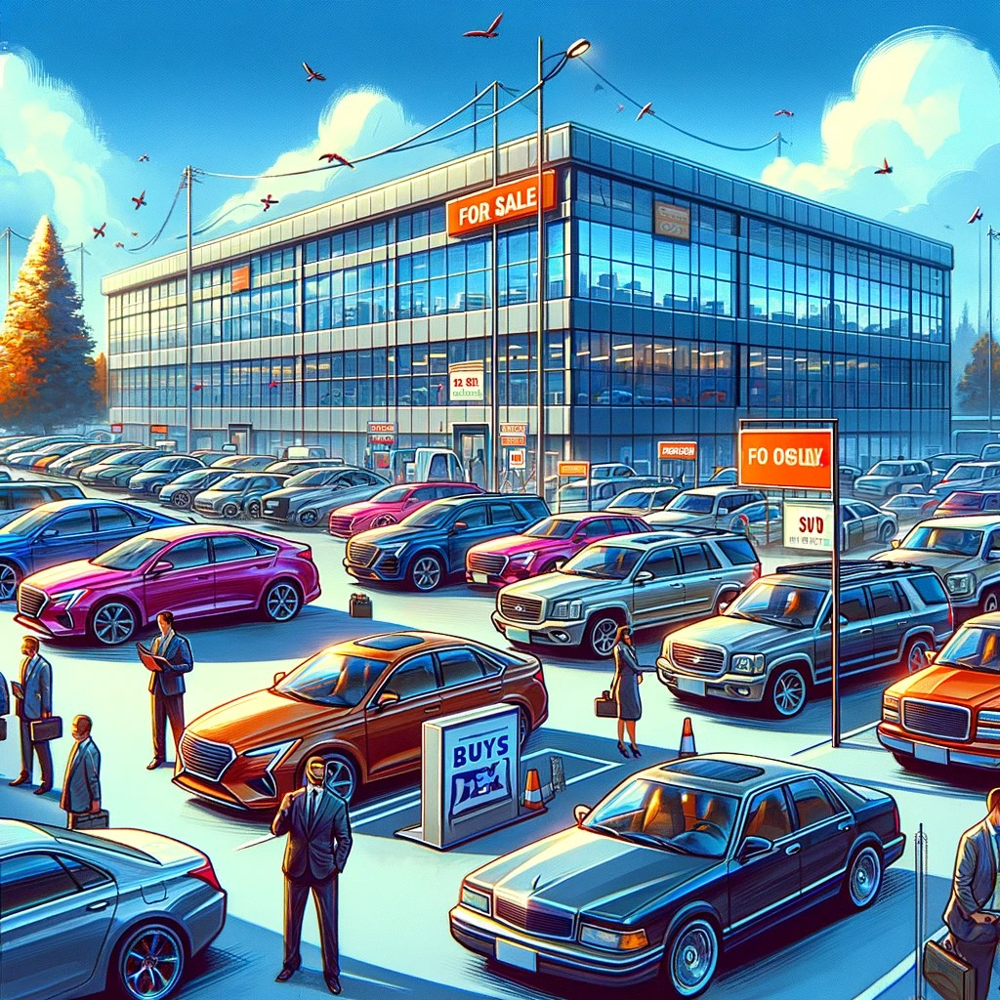

**Current Scenario**

Company has started facing loss in business due to the technical advancements.
There are several competitors in the market who have been using enhanced techniques.
The company is pretty old and they have been using traditional measures to estimate old cars prices.
These traditional measures include weight analysis, condition of parts and build year.
They are looking for a most robust way to estimate the price of the old car

---
<a name = Section2></a>
# **2. Problem Statement**
---

> The current process suffers from the following problems:

> They have been using manual traditional measures to estimate old cars prices.

> These measures are time consuming and not accurate.

> Company is looking for a robust way to estimate the prices of used cars.

---
<a name = Section3></a>
# **3. Installing & Importing Libraries**
---


In [54]:
pip install --upgrade pandas

In [55]:
import numpy as np
import pandas as pd    
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
from ydata_profiling import ProfileReport
from sklearn.preprocessing import LabelEncoder, StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer

import warnings                                                     # Importing warning to disable runtime warnings
warnings.filterwarnings("ignore")                                   # Warnings will appear only once

---
<a name = Section4></a>
# **4. Data Acquisition & Description**
---

|Feature|Description|
|:--|:--|
Column Name|	Description
ID|	Feature uniquely identifying each record
symbolling|	Degree to which the auto is riskier than its price indicates.
normalized-losses|	Relative average loss payment per insured vehicle year.
make|	Make of the car.
fuel-type|	Type of fuel consumed by the car.
aspiration|	Type of internal combustion engine used.
num-of-doors|	Number of doors available in the car.
body-style|	Body style of car
drive-wheels|	Drive wheel of car.
engine-location|	Location of engine in car.
wheel-base|	Distance between the centres of the front and rear wheels.
length|	Length of the car.
width|	Width of the car.
height|	Height of the car.
curb-weight|	Total mass of a vehicle with standard equipment.
engine-type|	Type of engine used in the car.
num-of-cylinders|	Number of cylinders used in the car.
engine-size|	Size of the engine used in the car.
fuel-system|	Type of fuel system used in the car.
bore|	Diameter of each cylinder in the piston engine.
stroke|	Full travel of the piston along the cylinder, in either direction.
compression-ratio|	Volume of the cylinder and the combustion chamber when the piston is at the bottom, and the volume of the combustion chamber when the piston is at the top.
horsepower|	The power an engine produces by a car.
peak-rpm|	The max power produced by engine in terms of revolutions per minute.
city-mpg|	City mileage per gallon rating of car.
highway-mpg|	Highway mileage per gallon rating of car.
price|	Price of the car.


In [56]:
# Laod the training Dataset
car_train_data = pd.read_csv(r"E:\DATA SCIENCE\MLProjects\Price Prediction of Used Cars\TrainData.csv")
print("Shape of the Train Dataset", car_train_data.shape)
car_train_data.head()

Shape of the Train Dataset (181, 27)


,ID,symboling,normalized-losses,make,fuel-type,aspiration,num-of-doors,body-style,drive-wheels,engine-location,...,engine-size,fuel-system,bore,stroke,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg,price
0,1,-1,65,toyota,gas,std,four,hatchback,fwd,front,...,122,mpfi,3.31,3.54,8.7,92,4200,27,32,11248
1,2,0,188,bmw,gas,std,two,sedan,rwd,front,...,164,mpfi,3.31,3.19,9.0,121,4250,21,28,20970
2,3,0,?,renault,gas,std,four,wagon,fwd,front,...,132,mpfi,3.46,3.9,8.7,?,?,23,31,9295
3,4,0,161,peugot,diesel,turbo,four,sedan,rwd,front,...,152,idi,3.7,3.52,21.0,95,4150,28,33,13200
4,5,-2,103,volvo,gas,std,four,sedan,rwd,front,...,141,mpfi,3.78,3.15,9.5,114,5400,24,28,15985


In [90]:
# Laod the test Dataset
car_test_data = pd.read_csv(r"E:\DATA SCIENCE\MLProjects\Price Prediction of Used Cars\TestData.csv")
print("Shape of the Test Dataset", car_test_data.shape)
car_test_data.head(20)

Shape of the Test Dataset (20, 26)


,ID,symboling,normalized-losses,make,fuel-type,aspiration,num-of-doors,body-style,drive-wheels,engine-location,...,num-of-cylinders,engine-size,fuel-system,bore,stroke,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg
0,1,-2,103,volvo,gas,std,four,sedan,rwd,front,...,four,141,mpfi,3.78,3.15,9.5,114,5400,23,28
1,2,0,188,bmw,gas,std,four,sedan,rwd,front,...,six,164,mpfi,3.31,3.19,9.0,121,4250,21,28
2,3,-1,74,volvo,gas,turbo,four,wagon,rwd,front,...,four,130,mpfi,3.62,3.15,7.5,162,5100,17,22
3,4,1,154,plymouth,gas,std,four,sedan,fwd,front,...,four,90,2bbl,2.97,3.23,9.4,68,5500,31,38
4,5,1,103,nissan,gas,std,four,wagon,fwd,front,...,four,97,2bbl,3.15,3.29,9.4,69,5200,31,37
5,6,2,94,volkswagen,diesel,turbo,four,sedan,fwd,front,...,four,97,idi,3.01,3.40,23.0,68,4500,37,42
6,7,0,118,mazda,gas,std,four,sedan,rwd,front,...,four,140,mpfi,3.76,3.16,8.0,120,5000,19,27
7,8,0,161,peugot,gas,std,four,sedan,rwd,front,...,four,120,mpfi,3.46,3.19,8.4,97,5000,19,24
8,9,1,101,honda,gas,std,two,hatchback,fwd,front,...,four,92,1bbl,2.91,3.41,9.2,76,6000,30,34
9,10,2,161,mitsubishi,gas,std,two,hatchback,fwd,front,...,four,92,2bbl,2.97,3.23,9.4,68,5500,31,38


In [58]:
car_train_data.describe()

,ID,symboling,wheel-base,length,width,height,curb-weight,engine-size,compression-ratio,city-mpg,highway-mpg,price
count,181.000000,181.000000,181.000000,181.000000,181.000000,181.000000,181.000000,181.000000,181.000000,181.000000,181.000000,181.000000
mean,91.000000,0.850829,98.729282,174.174033,65.943646,53.709945,2564.165746,127.900552,10.154254,25.132597,30.646409,13271.314917
std,52.394338,1.267045,6.116197,12.336569,2.146114,2.497735,523.489016,42.578438,3.982306,6.418211,6.888545,8106.479635
min,1.000000,-2.000000,86.600000,141.100000,60.300000,47.800000,1488.000000,61.000000,7.000000,13.000000,16.000000,5118.000000
25%,46.000000,0.000000,94.500000,166.800000,64.200000,51.600000,2190.000000,98.000000,8.600000,19.000000,25.000000,7775.000000
50%,91.000000,1.000000,96.900000,173.200000,65.500000,54.100000,2420.000000,120.000000,9.000000,24.000000,30.000000,10295.000000
75%,136.000000,2.000000,102.400000,183.100000,66.600000,55.500000,2935.000000,146.000000,9.400000,30.000000,34.000000,16500.000000
max,181.000000,3.000000,120.900000,208.100000,72.000000,59.800000,4066.000000,326.000000,23.000000,49.000000,54.000000,45400.000000


In [59]:
car_train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 181 entries, 0 to 180
Data columns (total 27 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   ID                 181 non-null    int64  
 1   symboling          181 non-null    int64  
 2   normalized-losses  181 non-null    object 
 3   make               181 non-null    object 
 4   fuel-type          181 non-null    object 
 5   aspiration         181 non-null    object 
 6   num-of-doors       181 non-null    object 
 7   body-style         181 non-null    object 
 8   drive-wheels       181 non-null    object 
 9   engine-location    181 non-null    object 
 10  wheel-base         181 non-null    float64
 11  length             181 non-null    float64
 12  width              181 non-null    float64
 13  height             181 non-null    float64
 14  curb-weight        181 non-null    int64  
 15  engine-type        181 non-null    object 
 16  num-of-cylinders   181 non

In [60]:
car_test_submission = car_test_data
car_test_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20 entries, 0 to 19
Data columns (total 26 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   ID                 20 non-null     int64  
 1   symboling          20 non-null     int64  
 2   normalized-losses  20 non-null     object 
 3   make               20 non-null     object 
 4   fuel-type          20 non-null     object 
 5   aspiration         20 non-null     object 
 6   num-of-doors       20 non-null     object 
 7   body-style         20 non-null     object 
 8   drive-wheels       20 non-null     object 
 9   engine-location    20 non-null     object 
 10  wheel-base         20 non-null     float64
 11  length             20 non-null     float64
 12  width              20 non-null     float64
 13  height             20 non-null     float64
 14  curb-weight        20 non-null     int64  
 15  engine-type        20 non-null     object 
 16  num-of-cylinders   20 non-nu

<a name = Section51></a>

---
# **5. Data Pre-Processing**
---

In [71]:
# Profile Report
profile = ProfileReport(df= car_train_data)
print("Accomplished")

profile.to_notebook_iframe()

Accomplished


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

**Observation**

- The dataset contains missing values represented by "?". These need to be handled, either by imputation or removal.
    
- Some columns that appear to be numeric (e.g., normalized-losses, bore, stroke, horsepower, peak-rpm, and price) are currently read as objects due to the presence of "?". Converting these to appropriate numeric types after handling missing values is essential.
    
- Categorical variables such as make, fuel-type, aspiration, num-of-doors, body-style, drive-wheels, engine-location, and fuel-system will need encoding to convert them into a numerical format suitable for regression analysis.
    
- Removing the ID column as it is not useful for prediction.
    
- Need to address correlations by potentially removing one of each pair of highly correlated features or applying dimensionality reduction techniques.

In [61]:
# Replace "?" with NaN to properly identify missing values
car_train_data.replace("?", pd.NA, inplace=True)      # pd.NA is a newer representation of missing data in pandas. It is more consistent and works seamlessly with different data types (integer, boolean, etc.), which was not the case with np.nan or None
car_test_data.replace("?", pd.NA, inplace=True)

# Convert columns with numeric values but are of type object to numeric (float)
numeric_columns_train = ['normalized-losses', 'bore', 'stroke', 'horsepower', 'peak-rpm','price']
car_train_data[numeric_columns_train] = car_train_data[numeric_columns_train].apply(pd.to_numeric, errors='coerce')

# Check for missing values in the tran dataset
missing_values_train = car_train_data.isna().sum()

# Display columns with missing values and their count of missing data,
missing_values_train[missing_values_train > 0]


normalized-losses    34
num-of-doors          2
bore                  4
stroke                4
horsepower            2
peak-rpm              2
dtype: int64

In [62]:
# Convert columns with numeric values but are of type object to numeric (float)
numeric_columns_test = ['normalized-losses', 'bore', 'stroke', 'horsepower', 'peak-rpm']
car_test_data[numeric_columns_test] = car_test_data[numeric_columns_test].apply(pd.to_numeric, errors='coerce')

# Check for missing values in the tran dataset
missing_values_test = car_test_data.isna().sum()

# Display columns with missing values and their count of missing data,
missing_values_test[missing_values_test > 0]

normalized-losses    3
dtype: int64

In [63]:
# Impute missing values for 'num-of-doors' based on the most common value
car_train_data['num-of-doors'].fillna(car_train_data['num-of-doors'].mode()[0], inplace=True)

# Impute missing numerical values with the median of their respective columns
for column in ['normalized-losses', 'bore', 'stroke', 'horsepower', 'peak-rpm']:
    car_train_data[column].fillna(car_train_data[column].median(), inplace=True)

# Verify if all missing values have been handled
car_train_data.isna().sum().max()

0

In [64]:
car_test_data['normalized-losses'].fillna(car_test_data['normalized-losses'].median(), inplace=True)
car_test_data.isna().sum().max()

0

<a name=Section6 id=Section6></a>

---
# **6. Exploratory Data Analysis**
---

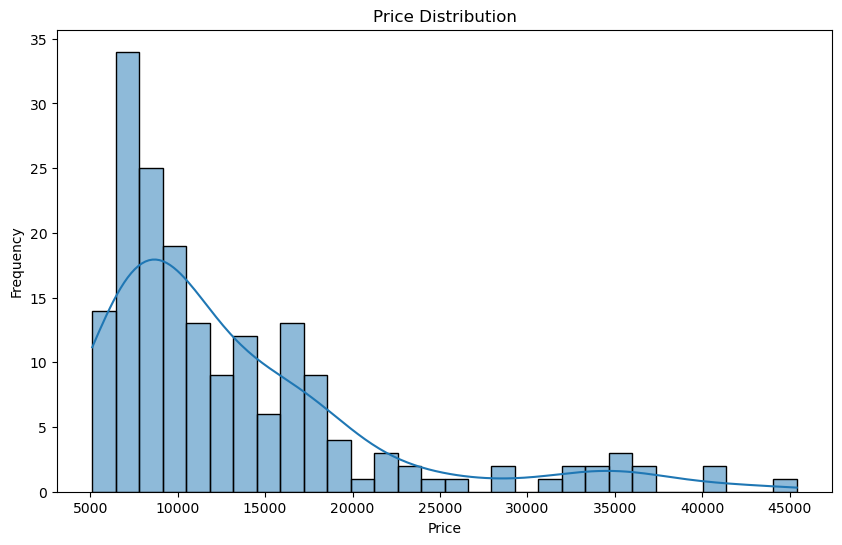

count      181.000000
mean     13271.314917
std       8106.479635
min       5118.000000
25%       7775.000000
50%      10295.000000
75%      16500.000000
max      45400.000000
Name: price, dtype: float64


In [65]:
import seaborn as sns
import matplotlib.pyplot as plt

# Univariate Analysis of 'price'
plt.figure(figsize=(10, 6))
sns.histplot(car_train_data['price'], kde=True, bins=30)
plt.title('Price Distribution')
plt.xlabel('Price')
plt.ylabel('Frequency')
plt.show()

# Summary statistics
print(car_train_data['price'].describe())


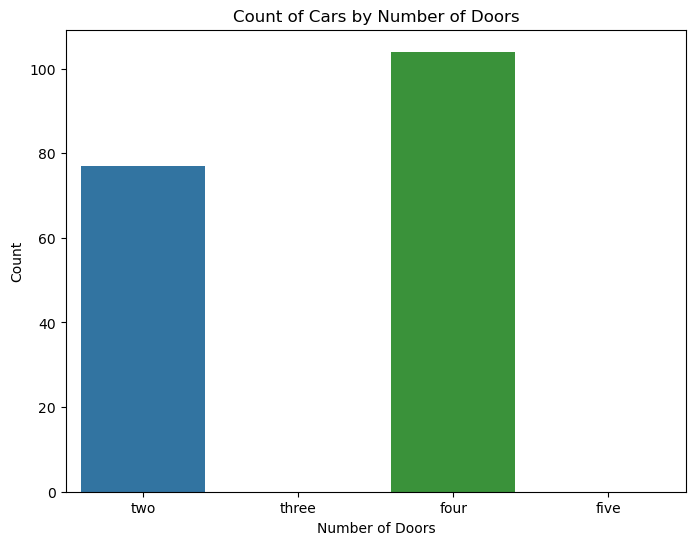

In [69]:
# Create a count plot for the number of doors
plt.figure(figsize=(8, 6))
sns.countplot(x='num-of-doors', data=car_train_data, order=['two', 'three', 'four', 'five'])
plt.title('Count of Cars by Number of Doors')
plt.xlabel('Number of Doors')
plt.ylabel('Count')
plt.show()

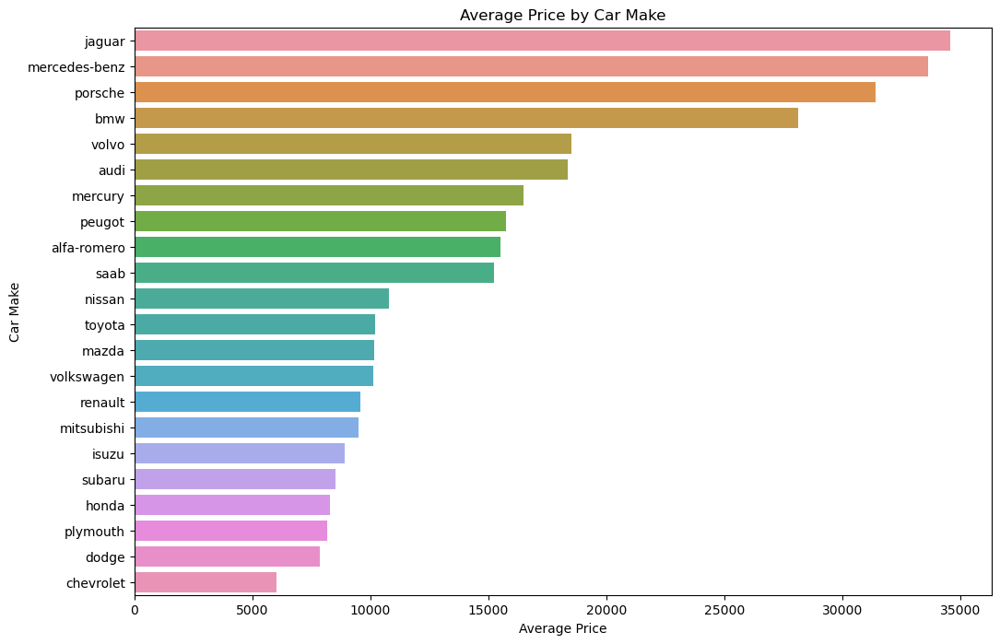

make       volvo
price    34600.0
dtype: object

In [67]:
# Calculate average price by car make
average_price_by_make = car_train_data.groupby('make')['price'].mean().sort_values(ascending=False)

# Convert the Series to DataFrame for easier plotting
average_price_by_make_df = average_price_by_make.reset_index()

# Plot
plt.figure(figsize=(12, 8))
sns.barplot(x='price', y='make', data=average_price_by_make_df)
plt.title('Average Price by Car Make')
plt.xlabel('Average Price')
plt.ylabel('Car Make')
plt.show()

average_price_by_make_df.max()

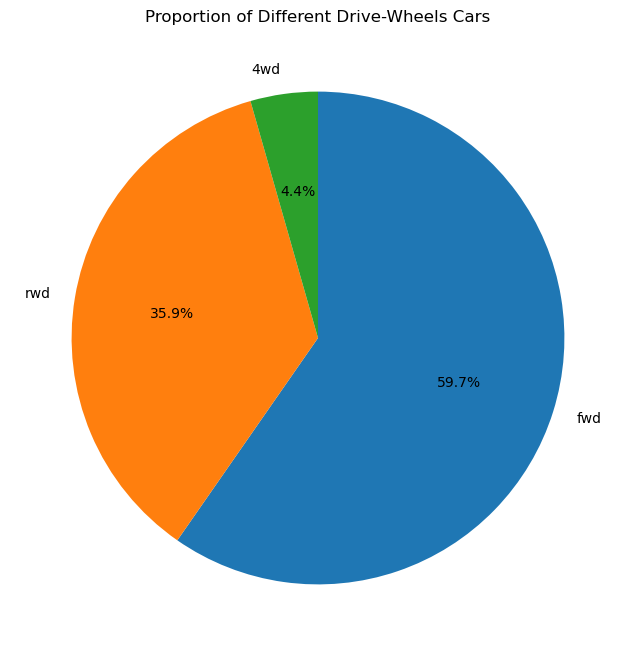

In [68]:
# Count the frequency of each drive-wheel configuration
drive_wheels_counts = car_train_data['drive-wheels'].value_counts()

# Plot
plt.figure(figsize=(8, 8))
drive_wheels_counts.plot.pie(autopct='%1.1f%%', startangle=90, counterclock=False)
plt.title('Proportion of Different Drive-Wheels Cars')
plt.ylabel('')  # Hide the y-label since it's not informative for a pie chart
plt.show()

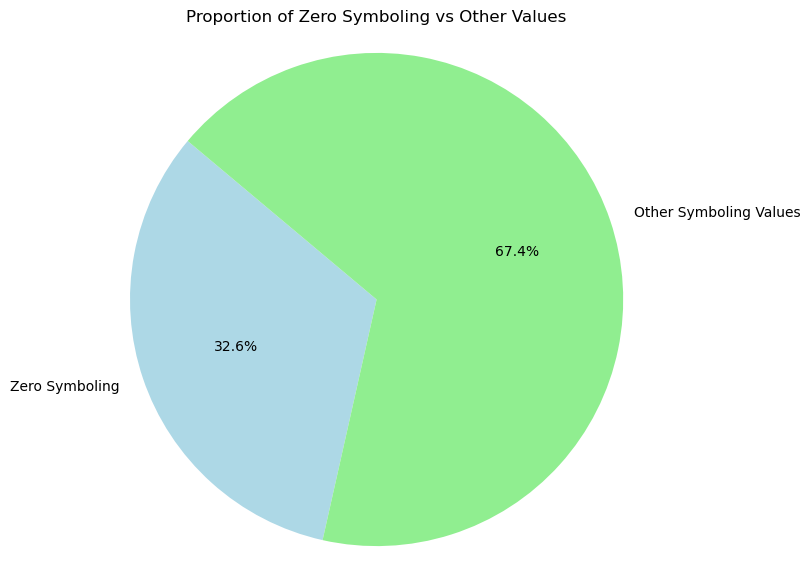

In [70]:
# Calculate the proportion of zeros in 'symboling'
symboling_counts = car_train_data['symboling'].value_counts(normalize=True)  # Get normalized counts
zero_proportion = symboling_counts.get(0, 0)  # Get proportion of zeros, default to 0 if not present

# Calculate proportion for other values by subtracting zero proportion from 1
other_proportion = 1 - zero_proportion

# Data to plot
labels = ['Zero Symboling', 'Other Symboling Values']
sizes = [zero_proportion, other_proportion]
colors = ['lightblue', 'lightgreen']

# Plot
plt.figure(figsize=(7, 7))
plt.pie(sizes, labels=labels, colors=colors, autopct='%1.1f%%', startangle=140)
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.title('Proportion of Zero Symboling vs Other Values')
plt.show()

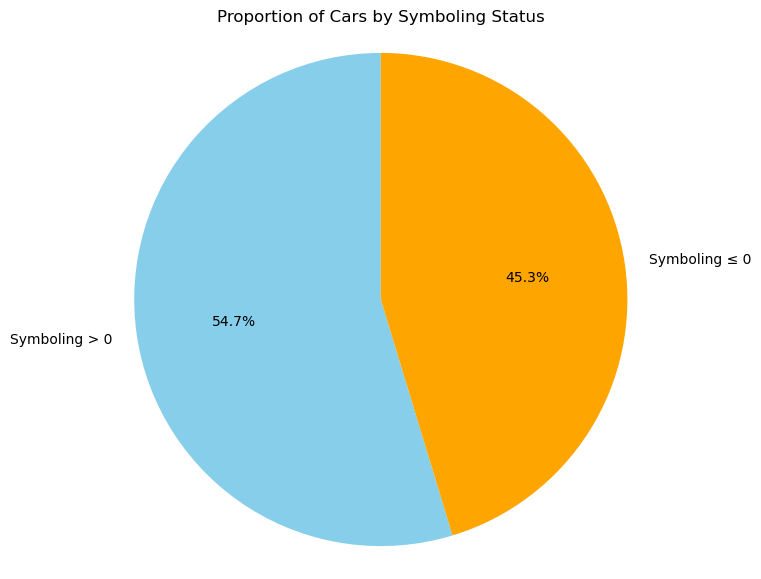

In [72]:
# Calculate the proportions
symboling_greater_than_zero = (car_train_data['symboling'] > 0).sum()
symboling_zero_or_less = (car_train_data['symboling'] <= 0).sum()

# Labels for the pie chart
labels = ['Symboling > 0', 'Symboling ≤ 0']

# Values for each segment
sizes = [symboling_greater_than_zero, symboling_zero_or_less]

# Colors for each segment
colors = ['skyblue', 'orange']

# Plot
plt.figure(figsize=(7, 7))
plt.pie(sizes, labels=labels, colors=colors, autopct='%1.1f%%', startangle=90)
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.title('Proportion of Cars by Symboling Status')
plt.show()

<a name=Section7 id=Section7></a>

---
# **7. Post Data Processing**
---



In [73]:
def encode_categorical_variables(car_train_data, car_test_data):
    categorical_columns = car_train_data.select_dtypes(include=['object']).columns
    label_encoders = {}
    for col in categorical_columns:
        le = LabelEncoder()
        car_train_data[col] = le.fit_transform(car_train_data[col].astype(str))
        # Handle unknown categories in test data
        if col in car_test_data:
            car_test_data[col] = car_test_data[col].map(lambda s: 'Unknown' if s not in le.classes_ else s)
            le.classes_ = np.append(le.classes_, 'Unknown')  # Add 'Unknown' to classes
            car_test_data[col] = le.transform(car_test_data[col].astype(str))
        label_encoders[col] = le
    return car_train_data, car_test_data, label_encoders


# Apply the function
car_train_data, car_test_data, label_encoders = encode_categorical_variables(car_train_data, car_test_data)

car_test_data

,ID,symboling,normalized-losses,make,fuel-type,aspiration,num-of-doors,body-style,drive-wheels,engine-location,...,num-of-cylinders,engine-size,fuel-system,bore,stroke,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg
0,1,-2,103.0,21,1,0,0,3,2,0,...,2,141,5,3.78,3.15,9.5,114,5400,23,28
1,2,0,188.0,2,1,0,0,3,2,0,...,3,164,5,3.31,3.19,9.0,121,4250,21,28
2,3,-1,74.0,21,1,1,0,4,2,0,...,2,130,5,3.62,3.15,7.5,162,5100,17,22
3,4,1,154.0,14,1,0,0,3,1,0,...,2,90,1,2.97,3.23,9.4,68,5500,31,38
4,5,1,103.0,12,1,0,0,4,1,0,...,2,97,1,3.15,3.29,9.4,69,5200,31,37
5,6,2,94.0,20,0,1,0,3,1,0,...,2,97,3,3.01,3.40,23.0,68,4500,37,42
6,7,0,118.0,8,1,0,0,3,2,0,...,2,140,5,3.76,3.16,8.0,120,5000,19,27
7,8,0,161.0,13,1,0,0,3,2,0,...,2,120,5,3.46,3.19,8.4,97,5000,19,24
8,9,1,101.0,5,1,0,1,2,1,0,...,2,92,0,2.91,3.41,9.2,76,6000,30,34
9,10,2,161.0,11,1,0,1,2,1,0,...,2,92,1,2.97,3.23,9.4,68,5500,31,38


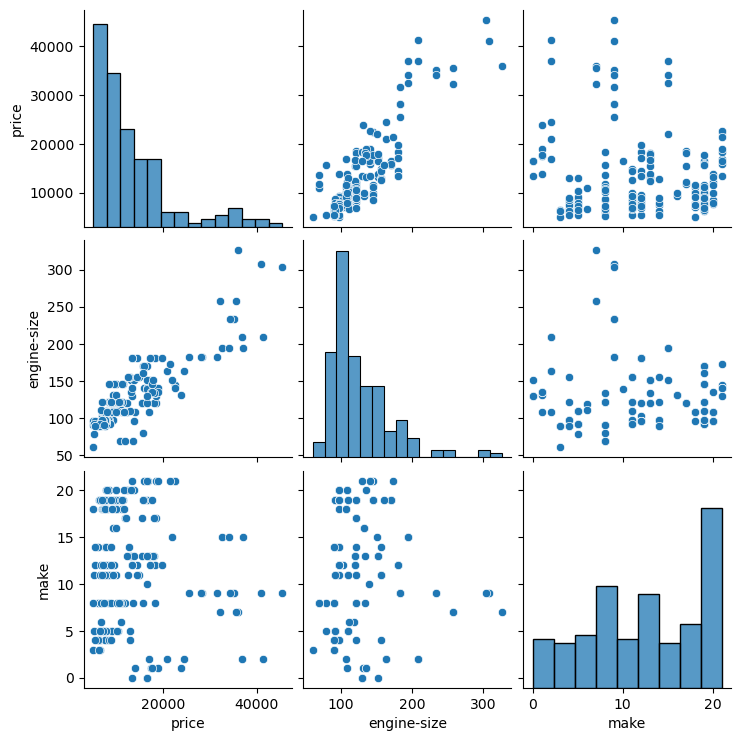

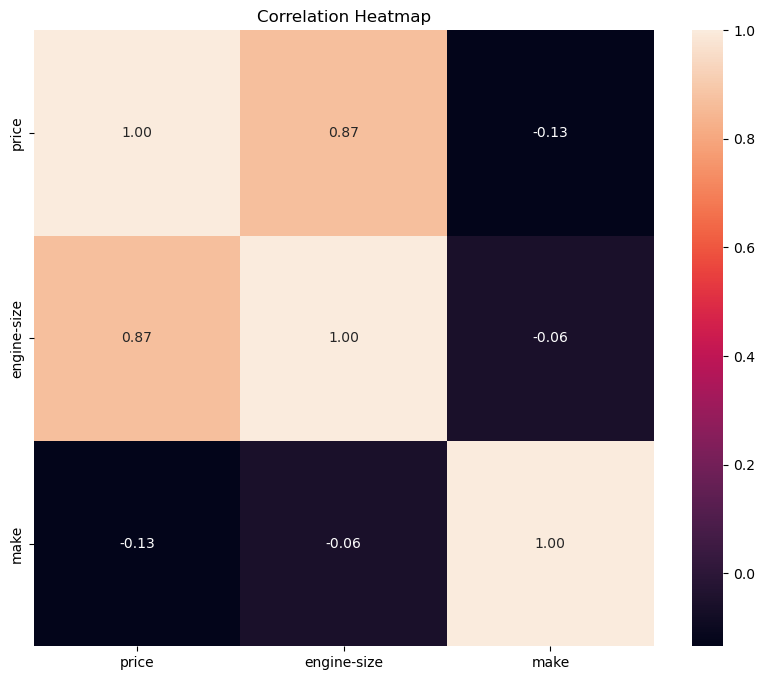

In [74]:
# Pairplot for 'price', 'engine-size', and a categorical variable 'make' (encoded as numbers)
sns.pairplot(car_train_data[['price', 'engine-size', 'make']])
plt.show()

# Correlation heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(car_train_data[['price', 'engine-size', 'make']].corr(), annot=True, fmt=".2f")
plt.title('Correlation Heatmap')
plt.show()

In [75]:
# Scaler encoding numeric column
scaler = StandardScaler()
car_train_data[numeric_columns_train[:-1]] = scaler.fit_transform(car_train_data[numeric_columns_train[:-1]])


In [76]:
car_test_data[numeric_columns_test] = scaler.transform(car_test_data[numeric_columns_test])

car_test_data

,ID,symboling,normalized-losses,make,fuel-type,aspiration,num-of-doors,body-style,drive-wheels,engine-location,...,num-of-cylinders,engine-size,fuel-system,bore,stroke,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg
0,1,-2,-0.530537,21,1,0,0,3,2,0,...,2,141,5,1.686802,-0.412549,9.5,0.263748,0.625098,23,28
1,2,0,2.159743,2,1,0,0,3,2,0,...,3,164,5,-0.110046,-0.281719,9.0,0.449604,-1.825263,21,28
2,3,-1,-1.448397,21,1,1,0,4,2,0,...,2,130,5,1.075110,-0.412549,7.5,1.538187,-0.014127,17,22
3,4,1,1.083631,14,1,0,0,3,1,0,...,2,90,1,-1.409893,-0.150888,9.4,-0.957590,0.838173,31,38
4,5,1,-0.530537,12,1,0,0,4,1,0,...,2,97,1,-0.721739,0.045357,9.4,-0.931039,0.198948,31,37
5,6,2,-0.815390,20,0,1,0,3,1,0,...,2,97,3,-1.256970,0.405140,23.0,-0.957590,-1.292576,37,42
6,7,0,-0.055782,8,1,0,0,3,2,0,...,2,140,5,1.610341,-0.379841,8.0,0.423053,-0.227201,19,27
7,8,0,1.305183,13,1,0,0,3,2,0,...,2,120,5,0.463417,-0.281719,8.4,-0.187616,-0.227201,19,24
8,9,1,-0.593837,5,1,0,1,2,1,0,...,2,92,0,-1.639278,0.437848,9.2,-0.745183,1.903547,30,34
9,10,2,1.305183,11,1,0,1,2,1,0,...,2,92,1,-1.409893,-0.150888,9.4,-0.957590,0.838173,31,38


In [77]:
# Removing the 'ID' column
car_train_data.drop(columns=['ID'], inplace=True)

In [78]:
car_test_data.drop(columns=['ID'], inplace=True)

<a name = Section8 id=Section8></a>

---
# **8. Model Development & Evaluation**
---

In [79]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_log_error
from scipy import stats

In [80]:
# Splitting the dataset into features and target variable
X = car_train_data.drop(['price'], axis=1)
y = car_train_data['price']

# Splitting the dataset into training and testing sets
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)


In [81]:
# Training the model
model = LinearRegression()
model.fit(X_train, y_train)

# Predictions for evaluation
predictions_train = model.predict(X_val)

# Calculate RMSE for training data
rmse_train = np.sqrt(mean_squared_error(y_val, predictions_train))

print(f"RMSE Score: {rmse_train}")

RMSE Score: 2427.2533091022983


In [82]:
# R-squared
r2 = r2_score(y_val, predictions_train)

# Adjusted R-squared
n = len(y_val)  # number of observations
p = X_train.shape[1]  # number of predictors
adjusted_r2 = 1 - (1 - r2) * (n - 1) / (n - p - 1)

# Mean Absolute Error
mae = mean_absolute_error(y_val, predictions_train)

# Mean Squared Logarithmic Error
msle = mean_squared_log_error(y_val, predictions_train)

print(f"R-squared: {r2}")
print(f"Adjusted R-squared: {adjusted_r2}")
print(f"Mean Absolute Error: {mae}")
print(f"Mean Squared Logarithmic Error: {msle}")

R-squared: 0.9201994914112709
Adjusted R-squared: 0.7388346991641592
Mean Absolute Error: 1944.540539762378
Mean Squared Logarithmic Error: 0.0479635507661463


In [83]:
# Model Prediction on Test Data
X_test = car_test_data
prediction_test= model.predict(X_test)

prediction_test

array([15974.75496106, 17345.42685153, 17056.2133189 ,  4470.35739033,
        4981.61761897,  8407.7899518 , 16361.97289071, 16361.28316494,
        8416.18668524,  6539.95645219, 20104.71493197,  5597.71084189,
        6396.40512495,  5493.32917647, 16023.45162683, 26726.80423582,
        9568.0565078 , 21087.16188415, 14357.95411964,  6137.5957119 ])

In [84]:
# Ensemble Model - Improve the performance of the model

from sklearn.ensemble import StackingRegressor, RandomForestRegressor
from sklearn.linear_model import LinearRegression
from xgboost import XGBRegressor

# Define base models
base_models = [
    ('rf', RandomForestRegressor(n_estimators=100, random_state=42)),
    ('xgb', XGBRegressor(objective='reg:squarederror', n_estimators=100, random_state=42))
]

# Define meta-model
meta_model = LinearRegression()

# Define the stacking ensemble
stacked_model = StackingRegressor(estimators=base_models, final_estimator=meta_model, cv=5)

# Splitting the dataset into training and testing sets
X_train_en, X_val_en, y_train_en, y_val_en = train_test_split(X, y, test_size=0.2, random_state=42)

# Fit the model
stacked_model.fit(X_train_en, y_train_en)

# Predictions and evaluation
predictions_en = stacked_model.predict(X_val_en)


In [85]:
# RMSE for Ensemble Model
rmse_en = np.sqrt(mean_squared_error(y_val_en, predictions_en))

# R-squared
r2_en = r2_score(y_val_en, predictions_en)

# Adjusted R-squared
n1 = len(y_val_en)  # number of observations
p1 = X_train_en.shape[1]  # number of predictors
adjusted_r2_en = 1 - (1 - r2_en) * (n1 - 1) / (n1 - p1 - 1)

# Mean Absolute Error
mae_en = mean_absolute_error(y_val_en, predictions_en)

# Mean Squared Logarithmic Error
msle_en = mean_squared_log_error(y_val_en, predictions_en)

print(f"RMSE Score: {rmse_en}")
print(f"R-squared: {r2_en}")
print(f"Adjusted R-squared: {adjusted_r2_en}")
print(f"Mean Absolute Error: {mae_en}")
print(f"Mean Squared Logarithmic Error: {msle_en}")

RMSE Score: 1608.4304398907288
R-squared: 0.9649587150818132
Adjusted R-squared: 0.8853194311768432
Mean Absolute Error: 1043.1667637242647
Mean Squared Logarithmic Error: 0.014426411224405605


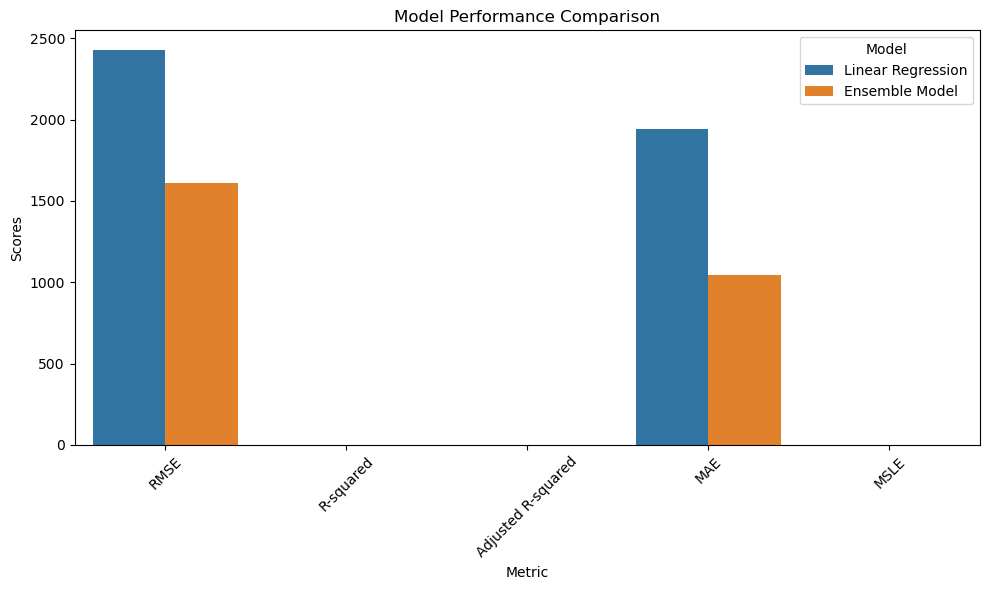

In [86]:
import matplotlib.pyplot as plt
import seaborn as sns

inear_regression_values = [2427.25, 0.9202, 0.7388, 1944.54, 0.04796]
ensemble_model_values = [1608.43, 0.9649, 0.8853, 1043.17, 0.01443]

# Redefine the data for visualization
data = {
    'Metric': ['RMSE', 'R-squared', 'Adjusted R-squared', 'MAE', 'MSLE'] * 2,
    'Score': linear_regression_values + ensemble_model_values,
    'Model': ['Linear Regression']*5 + ['Ensemble Model']*5
}

# Create DataFrame
df = pd.DataFrame(data)

# Creating the visualization with seaborn
plt.figure(figsize=(10, 6))
sns.barplot(x='Metric', y='Score', hue='Model', data=df)

plt.title('Model Performance Comparison')
plt.ylabel('Scores')
plt.xticks(rotation=45)
plt.legend(title='Model')

plt.tight_layout()
plt.show()

**Key Observations:**

- RMSE: The Ensemble Model shows a significantly lower RMSE, indicating better accuracy with lower prediction errors.

- R-squared & Adjusted R-squared: The Ensemble Model achieves higher values, suggesting it explains a larger portion of the variance in the target variable and remains effective even after adjusting for the number of predictors.

- MAE: With a lower MAE, the Ensemble Model's predictions are, on average, closer to the actual values.

- MSLE: The Ensemble Model also excels in MSLE, indicating superior performance in predicting across various magnitudes of the target variable.

- This side-by-side comparison effectively highlights the superior performance of the Ensemble Model over the Linear Regression model, showcasing the power of ensemble methods in improving prediction accuracy for complex regression tasks

In [87]:
# Model Prediction on Test Data using ensemble model
prediction_test_en= stacked_model.predict(X_test)

prediction_test_en

array([16100.62426039, 20279.65203563, 16528.50554516,  7378.76057103,
        7280.51411404,  8188.26139611, 14386.30361939, 15943.65969751,
        6308.14058585,  5953.82333234, 15749.24626972,  6401.82429843,
        8196.68612091,  6400.59415987, 14352.30872908, 35478.98932617,
        9569.63424134, 16016.91693429, 15909.99835746,  7842.99782542])

In [92]:
car_test_submission

,symboling,normalized-losses,make,fuel-type,aspiration,num-of-doors,body-style,drive-wheels,engine-location,wheel-base,...,num-of-cylinders,engine-size,fuel-system,bore,stroke,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg
0,-2,-0.530537,21,1,0,0,3,2,0,104.3,...,2,141,5,1.686802,-0.412549,9.5,0.263748,0.625098,23,28
1,0,2.159743,2,1,0,0,3,2,0,101.2,...,3,164,5,-0.110046,-0.281719,9.0,0.449604,-1.825263,21,28
2,-1,-1.448397,21,1,1,0,4,2,0,104.3,...,2,130,5,1.075110,-0.412549,7.5,1.538187,-0.014127,17,22
3,1,1.083631,14,1,0,0,3,1,0,93.7,...,2,90,1,-1.409893,-0.150888,9.4,-0.957590,0.838173,31,38
4,1,-0.530537,12,1,0,0,4,1,0,94.5,...,2,97,1,-0.721739,0.045357,9.4,-0.931039,0.198948,31,37
5,2,-0.815390,20,0,1,0,3,1,0,97.3,...,2,97,3,-1.256970,0.405140,23.0,-0.957590,-1.292576,37,42
6,0,-0.055782,8,1,0,0,3,2,0,104.9,...,2,140,5,1.610341,-0.379841,8.0,0.423053,-0.227201,19,27
7,0,1.305183,13,1,0,0,3,2,0,107.9,...,2,120,5,0.463417,-0.281719,8.4,-0.187616,-0.227201,19,24
8,1,-0.593837,5,1,0,1,2,1,0,93.7,...,2,92,0,-1.639278,0.437848,9.2,-0.745183,1.903547,30,34
9,2,1.305183,11,1,0,1,2,1,0,93.7,...,2,92,1,-1.409893,-0.150888,9.4,-0.957590,0.838173,31,38


In [95]:
submission_df = pd.DataFrame({
    'ID': car_test_data['ID'],  
    'Price': prediction_test_en
})

# Submission File exprort
submission_file_path = 'E:\DATA SCIENCE\MLProjects\Price Prediction of Used Cars\submission_final.csv'
submission_df.to_csv(submission_file_path, index=False, header=False)  

print("Submission file created:", submission_file_path)

Submission file created: E:\DATA SCIENCE\MLProjects\Price Prediction of Used Cars\submission_final.csv
